In [1]:
%ls
import pandas as pd
import numpy as np
import matplotlib, glob, os, re
%matplotlib inline
from matplotlib import pyplot as plt

 ANN-UNI-26382800-5_distances.npy*
 BAR-COM-4e090d3a-39_distances.npy*
 BAR-COM-4e090d3a-47_distances.npy*
 BAR-COM-4e090d3a-57_distances.npy*
 compound-set_ensemble-hybrid-oedocking.sdf*
 compound-set_FoldingAtHome_EE-FEP_051820.sdf*
 compound-set_FoldingAtHome_EE-FEP_051920.sdf*
 compound-set_FoldingAtHome_EE-FEP.pkl*
 compound-set_FoldingAtHome_EE-FEP.sdf*
 covid-moonshot-FEP-results-051220.sdf*
 crystal_analysis.ipynb*
 DAN-LON-a5fc619e-8_distances.npy*
 DAR-DIA-23aa0b97-13_distances.npy*
 DAR-DIA-23aa0b97-17_distances.npy*
 DAR-DIA-23aa0b97-20_distances.npy*
 DAR-DIA-842b4336-13_distances.npy*
 DAR-DIA-842b4336-3_distances.npy*
 DUN-NEW-d8381160-1_distances.npy*
 free_energy_predictions.ipynb*
 GAB-REV-70cc3ca5-13_distances.npy*
 GAB-REV-70cc3ca5-8_distances.npy*
 master_results_WL0.12_051820.pkl*
 master_results_WL0.12_051920_no_err_threshold.pkl*
 master_results_WL0.12_051920_no_min_nrg.pkl*
 master_results_WL0.12_051920.pkl*
 master_results_WL0.12_052920.pkl*
 master_results_WL

ModuleNotFoundError: No module named 'pandas'

In [22]:
wl = 'WL0.12'
MLTN_v2 = pd.read_pickle(max(glob.glob(f'../MLTN/results/MLTN_v2_0-78*pkl'), key=os.path.getctime))
MLTN_v3 = pd.read_pickle(max(glob.glob(f'../MLTN/results/MLTN_v3_0-78*pkl'), key=os.path.getctime))
MS0323_v2 = pd.read_pickle(max(glob.glob(f'../MS0323/results/MS0323_v2_1-500*pkl'), key=os.path.getctime))
MS0323_v3 = pd.read_pickle(max(glob.glob(f'../MS0323/results/MS0323_v3_1-500*pkl'), key=os.path.getctime))
MS0326_v2 = pd.concat([
    pd.read_pickle(max(glob.glob(f'../MS0326/results/MS0326_v2_1-3000*pkl'), key=os.path.getctime)),
    pd.read_pickle(max(glob.glob(f'../MS0326/results/MS0326_v2_3000-5538*pkl'), key=os.path.getctime))])
MS0326_v3 = pd.concat([
    pd.read_pickle(max(glob.glob(f'../MS0326/results/MS0326_v3_1-3000*pkl'), key=os.path.getctime)),
    pd.read_pickle(max(glob.glob(f'../MS0326/results/MS0326_v3_3000-5538*pkl'), key=os.path.getctime))])
MS0331_v2 = pd.read_pickle(max(glob.glob(f'../MS0331/results/MS0331_v2_0-2264*pkl'), key=os.path.getctime))
MS0331_v3 = pd.read_pickle(max(glob.glob(f'../MS0331/results/MS0331_v3_0-2264*pkl'), key=os.path.getctime))
MS0406_v2 = pd.read_pickle(max(glob.glob(f'../MS0406/results/MS0406_v2_0-428*pkl'), key=os.path.getctime))
MS0406_v3 = pd.read_pickle(max(glob.glob(f'../MS0406/results/MS0406_v3_0-428*pkl'), key=os.path.getctime))
MS0406_2_v2 = pd.concat([
    pd.read_pickle(max(glob.glob(f'../MS0406-2/results/MS0406-2_v2_0-2999*pkl'), key=os.path.getctime))]) #,
    #pd.read_pickle(max(glob.glob(f'../MS0406-2/results/MS0406-2_v2_3000-3622*pkl'), key=os.path.getctime))])
MS0406_2_v3 = pd.concat([
    pd.read_pickle(max(glob.glob(f'../MS0406-2/results/MS0406-2_v3_0-2999*pkl'), key=os.path.getctime))]) #,
    #pd.read_pickle(max(glob.glob(f'../MS0406-2/results/MS0406-2_v3_3000-3622*pkl'), key=os.path.getctime))])
results = pd.concat([MS0323_v2,MS0323_v3,MS0326_v2,MS0326_v3,MS0331_v2,
                     MS0331_v3,MS0406_v2,MS0406_v3,MS0406_2_v2,MS0406_2_v3])
results = results.sort_values(by=['febkT']) # sort concatenated results by binding energy
#results = results.loc[results['ns_RL'].str.len() <= 2] # require at least 3 RL clones
#results.to_pickle('results_051220_WL0.12.pkl')
print(max(results.error.values))
#results = results.loc[results.dataset.str.contains('v3')]
results = results.loc[(results.febkT < 0) & (results.febkT > -26)]
#results = results.loc[results.error < 10]
results


82.759442616653


,dataset,fah,identity,receptor,score,febkT,error,ns_RL,ns_L,wl_RL,L_error,RL_error
1960,MS0326_v3,PROJ14824/RUN1972,SAL-INS-1c7-2,Mpro-x1374-protein.pdb,-1.910246,-25.819026,34.448038,"[128, 156, 62, 22, 2]","[440, 380, 510, 510, 280]","[0.23059, 0.23059, 0.23059, 0.28824, 0.28824]",24.637372,0.186553
258,MS0323_v3,PROJ14822/RUN258,DAR-DIA-43a-5,protein-0387.pdb,-5.201610,-25.546943,3.773523,"[131, 89, 74, 113, 80]","[450, 490, 540, 410, 620]","[0.18446, 0.14757, 0.18446, 0.18446, 0.18446]",0.116912,3.280887
1178,MS0326_v3,PROJ14823/RUN1202,MUS-SCH-c2f-13,Mpro-x0107-protein.pdb,-9.550890,-25.259420,22.776358,"[121, 138, 96, 16, 5]","[200, 200, 200, 200, 200]","[0.18446, 0.18446, 0.23058, 0.23058, 0.23058]",16.216396,0.109175
533,MS0331_v3,PROJ14825/RUN685,MAK-UNK-129-18,Mpro-x0107_0.pdb,-8.425830,-24.789359,11.331330,"[58, 68, 5, 7]",[200],"[0.37782, 0.30226, 0.9224, 0.59034]",0.000000,9.238496
2887,MS0326_v3,PROJ14823/RUN2911,√ÅLV-UNI-7ff-30,Mpro-x0540-protein.pdb,-2.774634,-24.447756,6.605737,"[174, 124, 70]","[200, 200, 200, 200, 200]","[0.14757, 0.14757, 0.18446]",0.042010,5.184169
...,...,...,...,...,...,...,...,...,...,...,...,...
225,MS0406_v3,PROJ14852/RUN226,DR -UNK-640-2,Mpro-x1093_0.pdb,-5.077204,-0.003063,10.804589,"[67, 47, 90, 91, 72]","[200, 200, 200, 200, 200]","[0.23059, 0.28824, 0.28824, 0.23059, 0.28824]",0.185002,10.277200
648,MS0326_v3,PROJ14823/RUN666,BEN-VAN-d8f-3,Mpro-x0107-protein.pdb,-7.350372,-0.002803,6.767307,"[130, 52, 71, 37, 6]","[200, 200, 200, 200, 200]","[0.18448, 0.18448, 0.14758, 0.14758, 0.18448]",0.059498,3.905684
235,MS0326_v3,PROJ14824/RUN236,CHR-SOS-70e-3,Mpro-x0678-protein.pdb,-11.335578,-0.001972,7.126099,"[159, 77, 89, 83, 5]","[200, 200, 200, 200, 200]","[0.14758, 0.18448, 0.18448, 0.18448, 0.2306]",0.958738,2.769119
994,MS0326_v3,PROJ14824/RUN999,JOH-MEM-4bb-1,Mpro-x0104-protein.pdb,-9.405090,-0.001628,4.430811,"[134, 122, 66, 25, 10]","[200, 200, 200, 200]","[0.14758, 0.18448, 0.18448, 0.18448, 0.18448]",0.870160,1.623447


In [27]:
results_non_zero_error = results.loc[results['RL_error'] != 0]
avg_RL_error = np.average(results_non_zero_error.error.values)
results_non_zero_error = results.loc[results['L_error'] != 0]
avg_L_error = np.average(results_non_zero_error.error.values)
#print(avg_RL_error, avg_L_error)
df = []
master_csv = pd.read_csv('../masters/covid_submissions_all_info-noncovalent.csv')

for i in set(results.identity.values):
    data = results.loc[results.identity == i]
    try:
        name = get_new_CID_from_old(re.sub('√ÅLV','ÁLV',i))
    except Exception as e:
        name = i
    csv_loc = master_csv.loc[master_csv.TITLE == name]
    if csv_loc.empty:
        #print(name,i)
        continue
    smiles = csv_loc.SMILES.values[0]
    if len(data) > 1:
        df.append(data.loc[data.febkT == min(data.febkT.values)].values[0])
    else:
        df.append(data.values[0])
for i in df:
    if len(i[7]) == 1:
        i[6] += avg_RL_error
    if len(i[8]) == 1:
        i[6] += avg_L_error
df = pd.DataFrame(df, columns=data.columns)
df = df.sort_values(by=['febkT'])
df.to_pickle('master_results_WL1.0_080220.pkl')
print(df)

          dataset                fah         identity                receptor  \
1155    MS0323_v3   PROJ14822/RUN258    DAR-DIA-43a-5        protein-0387.pdb   
609     MS0326_v3  PROJ14823/RUN1202   MUS-SCH-c2f-13  Mpro-x0107-protein.pdb   
759     MS0331_v3   PROJ14825/RUN685   MAK-UNK-129-18        Mpro-x0107_0.pdb   
615     MS0326_v3  PROJ14823/RUN2911  √ÅLV-UNI-7ff-30  Mpro-x0540-protein.pdb   
1086    MS0326_v3  PROJ14823/RUN2580    SEL-UNI-842-3  Mpro-x0397-protein.pdb   
...           ...                ...              ...                     ...   
482     MS0326_v3  PROJ14824/RUN2500    DAR-DIA-033-7  Mpro-x0434-protein.pdb   
175   MS0406-2_v3   PROJ14827/RUN849    WAR-XCH-b68-7        Mpro-x0104_0.pdb   
274     MS0331_v3  PROJ14825/RUN1766    DUN-NEW-f8c-5        Mpro-x0072_0.pdb   
1055    MS0326_v3   PROJ14823/RUN478    WAR-XCH-eb7-5  Mpro-x0434-protein.pdb   
1032    MS0331_v3   PROJ14825/RUN707    WAR-XCH-b68-6        Mpro-x0072_0.pdb   

         score      febkT  

In [4]:
print(df)

Empty DataFrame
Columns: [dataset, fah, identity, receptor, score, febkT, error, ns_RL, ns_L, wl_RL, L_error, RL_error]
Index: []


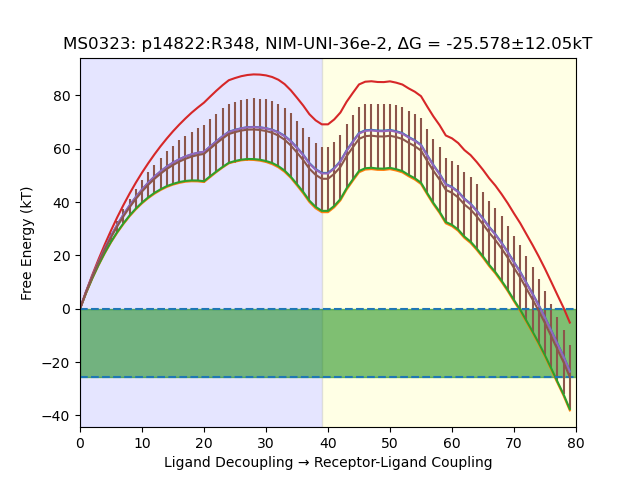

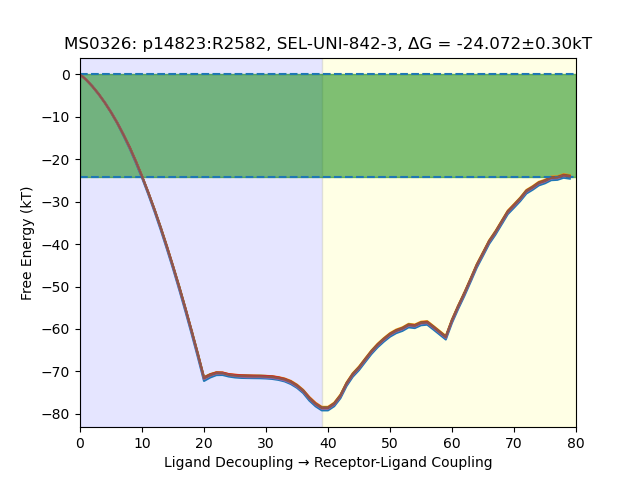

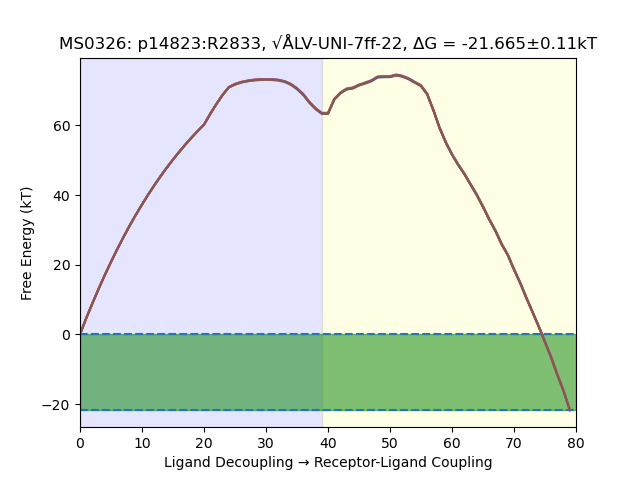

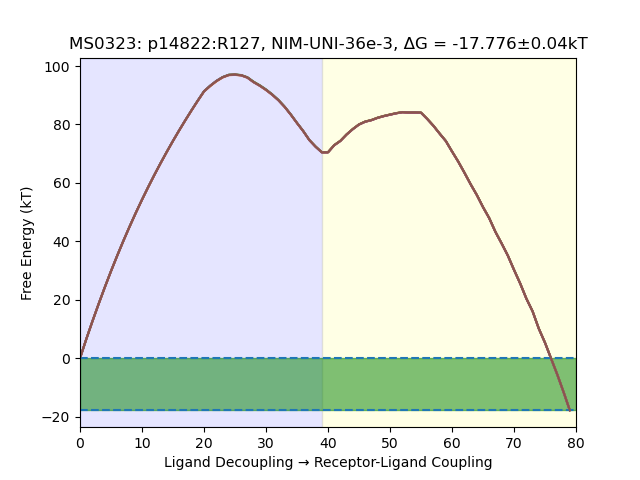

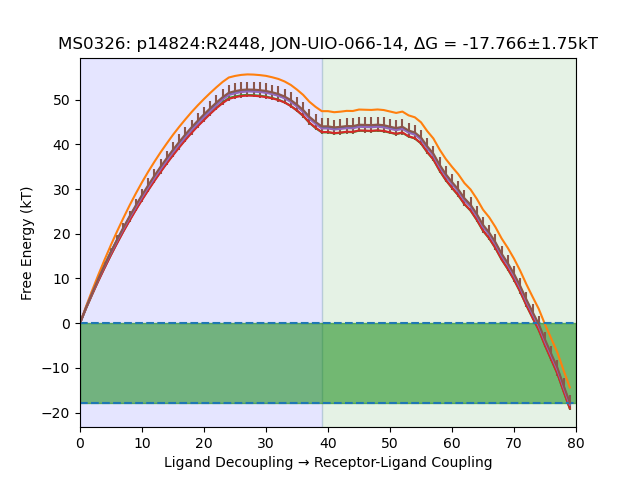

...

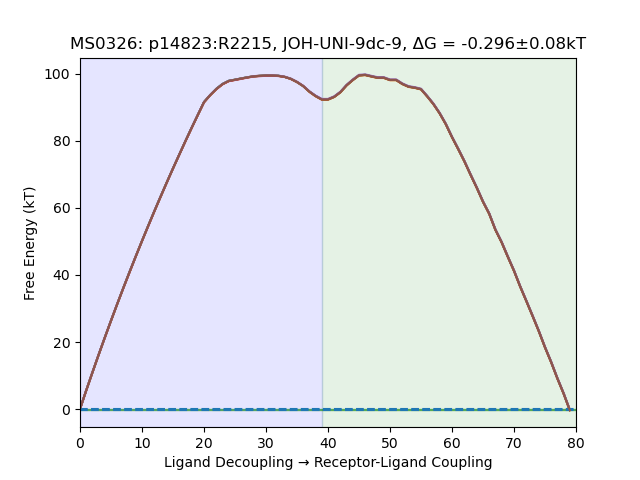

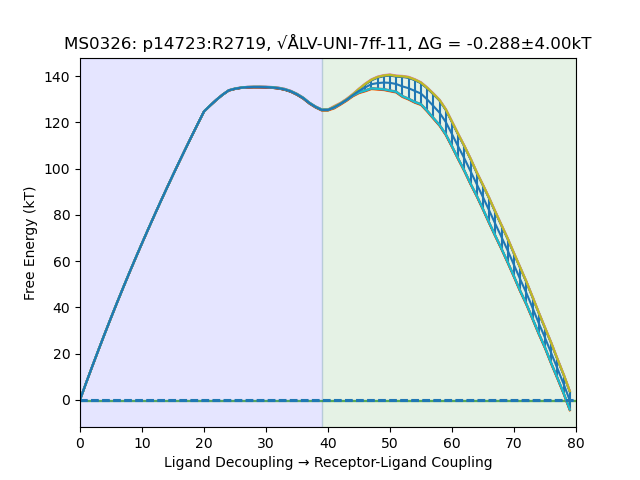

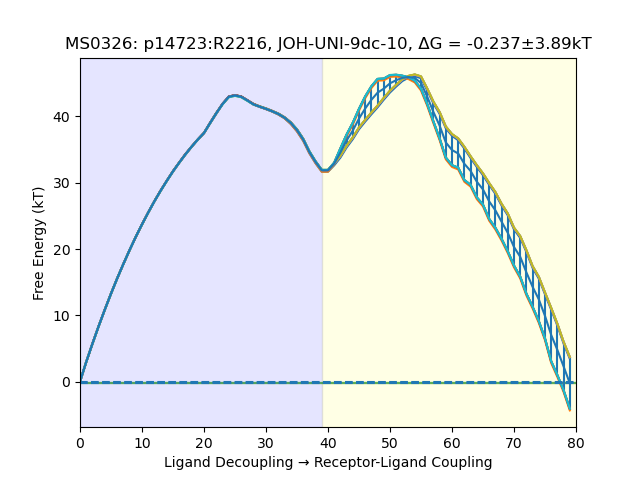

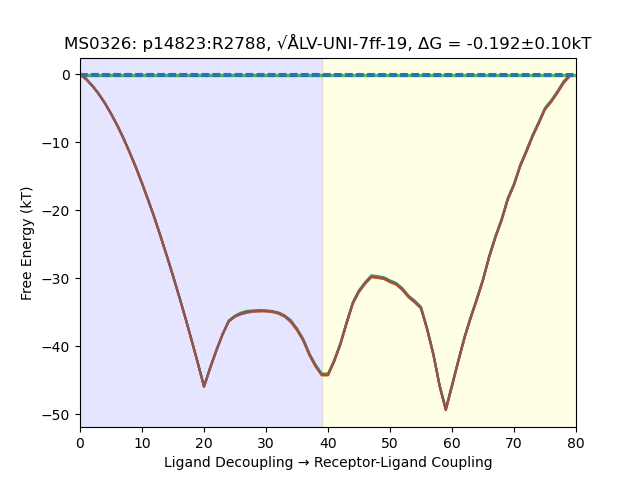

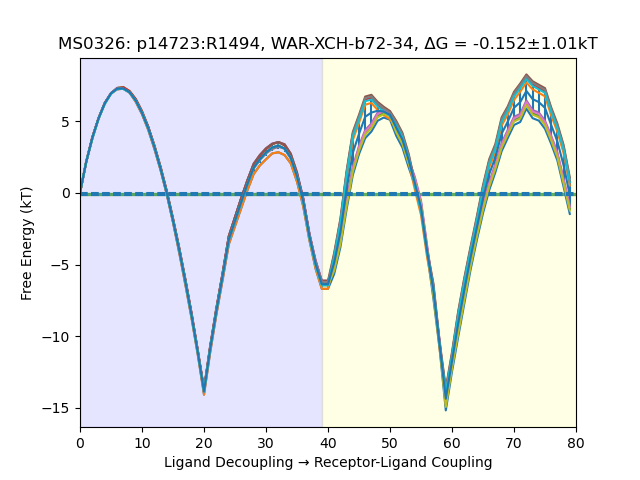

In [88]:
# Look at some plots
from IPython.display import Image, display
ndx = 0
for index, row in df.iterrows():
    dataset = row.dataset.split('_')[0]
    version = row.dataset.split('_')[1]
    project = row.fah.split('/')[0][4:]
    run = row.fah.split('/')[1][3:]
    identity = row.identity
    try:
        img = glob.glob(f'../{dataset}/plots/*{version}*p{project}_{run}*')[0]
    except Exception as e:
        continue
    display(Image(filename=img,width=600,height=600))
    ndx += 1
    #if ndx == 20:
    #    sys.exit()

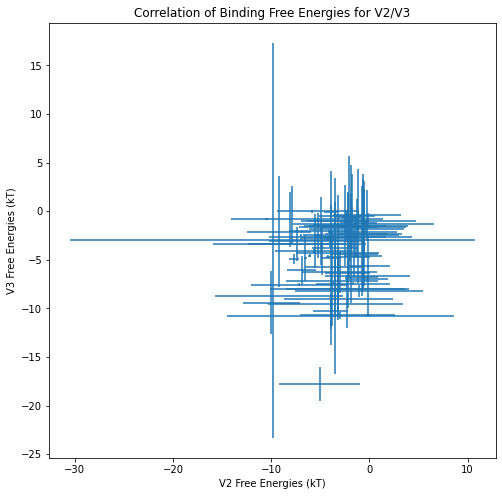

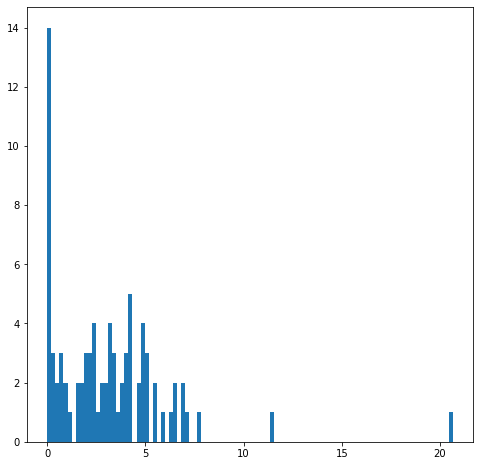

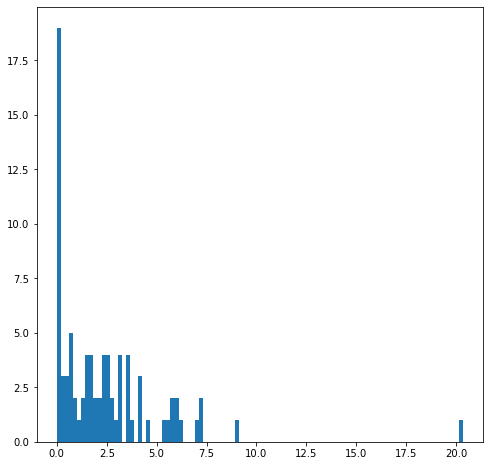

[3.1408279539289676, 2.9974418970490757] [2.447888027580019, 2.8809692936069857]


In [89]:
from statistics import *
v2_energies, v2_error, v3_energies, v3_error = [],[],[],[]

for index, row in results.loc[results['dataset'].str.contains('v2')].iterrows():
    v3 = results.loc[(results.score == row.score) & (results.identity == row.identity)
                     & results['dataset'].str.contains('v3')]
    try:
        v3_energies.append(float(v3.febkT.values[0]))
        v3_error.append(float(v3.error.values[0]))
        v2_energies.append(row.febkT)
        v2_error.append(row.error)
    except Exception as e:
        continue
plt.figure(0,figsize=(8,8))
plt.errorbar(v2_energies,v3_energies,xerr=v2_error,yerr=v3_error, linestyle='')
plt.xlabel('V2 Free Energies (kT)')
plt.ylabel('V3 Free Energies (kT)')
plt.title('Correlation of Binding Free Energies for V2/V3')
plt.show()
plt.figure(1,figsize=(8,8))
plt.hist(v2_error,bins=100)
plt.show()
plt.figure(2,figsize=(8,8))
plt.hist(v3_error,bins=100)
plt.show()
print([np.mean(v2_error),np.std(v2_error)],[np.mean(v3_error),np.std(v3_error)])

In [26]:
import pandas as pd
import copy
#exp = pd.read_csv('/home/yabmtm/Downloads/moonshot_initial_activity_data.csv')
df = pd.read_pickle('/home/yabmtm/packages/git/covid-FAH-CPU/FEP/dataframes/master_FEP.pkl')
all_df = pd.read_csv("https://covid.postera.ai/covid/submissions.csv")
new_CID_list = list(all_df['CID'])
old_CID_list = list(all_df['CID (old format)'])
old_to_new_CID_dict = {}
for old_CID, new_CID in zip(old_CID_list, new_CID_list):
    old_to_new_CID_dict[old_CID] = new_CID
new_to_old_CID_dict = {v: k for k, v in old_to_new_CID_dict.items()}
def get_new_CID_from_old(old_CID):
    return old_to_new_CID_dict[old_CID]
def get_old_CID_from_new(new_CID):
    return new_to_old_CID_dict[new_CID]

In [13]:
print(get_old_CID_from_new('DAV-CRI-14a23e73-1'))
print(df.loc[df['identity'] == 'DAV-CRI-14a-1'])

DAV-CRI-14a-1
           dataset       identity                receptor     score  \
75325    MS0326_RL  DAV-CRI-14a-1  Mpro-x0161-protein.pdb  -8.54252   
75326    MS0326_RL  DAV-CRI-14a-1  Mpro-x1382-protein.pdb  0.379413   
80864     MS0326_L  DAV-CRI-14a-1  Mpro-x0161-protein.pdb  -8.54252   
80865     MS0326_L  DAV-CRI-14a-1  Mpro-x1382-protein.pdb  0.379413   
87483  MS0406-2_RL  DAV-CRI-14a-1        Mpro-x0161_0.pdb  -8.54252   
91106   MS0406-2_L  DAV-CRI-14a-1        Mpro-x0161_0.pdb  -8.54252   

      v1_project v1_run v2_project v2_run v3_project v3_run project  run  
75325      14368    679      14724   2179      14824   2179     NaN  NaN  
75326      14368    680      14724   2180      14824   2180     NaN  NaN  
80864      14372    679       None   None       None   None     NaN  NaN  
80865      14372    680       None   None       None   None     NaN  NaN  
87483      14379    873      14727    873      14827    873     NaN  NaN  
91106      14380    873       None   N

In [90]:
import tqdm, re

out_sdf = '''  ver_1.2
  COVID Moonshot Alchemical Binding Energy Results via Folding@home

 9 0  0     0  0  0  0  0  0999 V2000
   -0.8680    1.0292   -23.901 C   0  0  0  0  0  0  0  0  0  0  0  0
    0.4574    1.0448   -23.901 C   0  0  0  0  0  0  0  0  0  0  0  0
   -0.2027    0.3535   -23.901 O   0  0  0  0  0  0  0  0  0  0  0  0
   -1.2683   -0.0208   -23.901 N   0  0  0  0  0  0  0  0  0  0  0  0
   -0.8732   -0.2963   -23.901 N   0  0  0  0  0  0  0  0  0  0  0  0
   -0.4574   -0.4418   -23.901 N   0  0  0  0  0  0  0  0  0  0  0  0
    0.0312   -0.4626   -23.901 N   0  0  0  0  0  0  0  0  0  0  0  0
    0.5042   -0.1819   -23.901 N   0  0  0  0  0  0  0  0  0  0  0  0
    0.8109    0.0624   -23.901 N   0  0  0  0  0  0  0  0  0  0  0  0
M  END

> <ref_mols>
a comma separated list of the fragments that inspired the design of the new molecule (codes as they appear in fragalysis - e.g. x0104_0,x0692_0)

> <original SMILES>
the original SMILES of the compound before any computation was carried out

> <Chemgauss4>
The [Chemgauss4 docking score](https://docs.eyesopen.com/toolkits/cpp/dockingtk/scoring.html#section-scoring-chemgauss4) of the best scoring pose and protonation/tautomeric state to any Mpro structure; more negative is better, and fragments score ~ -10

> <ref_pdb>
The name of the fragment (and corresponding Mpro fragment structure) with the best scoring hybrid docking pose

> <ref_url>
https://discuss.postera.ai/t/Updated-submission-for-FoldingAtHome-absolute-FEP-of-bound-mpro-structures/1291

> <submitter_name>
Matthew F.D. Hurley & Vincent A. Voelz

> <submitter_email>
matthew.hurley@temple.edu

> <submitter_institution>
Temple University

> <generation_date>
2020-05-19

> <method>
Folding@home absolute FEP

> <binding_free_energy>

Absolute binding free energy (kT) computed via Expanded Ensemble (Wang-Landau) Sampling using Folding@home

> <binding_std_error>

Standard Error of computed binding free energies (kT)

$$$$
'''
master_csv = pd.read_csv('../masters/covid_submissions_all_info.csv')
with open('compound-set_ensemble-hybrid-oedocking.sdf') as f:
    master_sdf = f.readlines()
results = pd.read_pickle('master_results_WL0.12_051920.pkl')
for index, row in tqdm.tqdm(results.iterrows(), total=results.shape[0]):
    name = get_new_CID_from_old(re.sub('√ÅLV','ÁLV',row.identity))
    csv_loc = master_csv.loc[master_csv.CID == name]
    smiles = csv_loc.SMILES.values[0]
    #if csv_loc.covalent_warhead.values:
    #    continue
    lines = []
    if 'MLTN' not in row.dataset:
        for x,line in enumerate(master_sdf):
            if line.strip('\n') == name:
                for mol_line in range(x,len(master_sdf)):
                    lines.append(master_sdf[mol_line])
                    if master_sdf[mol_line] == '> <creator>\n':
                        creator = master_sdf[mol_line+1].strip('\n').split(',')
                        if len(creator) == 1:
                            institution = 'None'
                        else:
                            institution = ', '.join(creator[1:])
                    elif master_sdf[mol_line] == '> <ref_mols>\n':
                        ref_mols = master_sdf[mol_line+1].strip('\n')
                    elif master_sdf[mol_line] == '> <ref_url>\n':
                        ref_url = master_sdf[mol_line+1].strip('\n')
                    if master_sdf[mol_line] == '$$$$\n':
                        break
                lines = lines[:lines.index('M  END\n')+1]
                break
    
    for line in ['\n> <original SMILES>', smiles, '> <ref_mols>', ref_mols, 
                 '> <ref_pdb>', f'receptors/{row.receptor}', '> <Chemgauss4>', row.score, 
                 '> <binding_free_energy>', row.febkT, '> <binding_std_error>', row.error]:
        lines.append(f'{line}\n\n')
  
    out_sdf += ''.join(lines) + '$$$$\n'
    with open('compound-set_FoldingAtHome_EE-FEP_051920.sdf', 'w') as f:
        f.write(out_sdf)

100%|██████████| 286/286 [00:06<00:00, 42.98it/s]


In [91]:
out_sdf = '''ID,original_SMILES,Chemgauss4,binding_free_energy,std_binding_error\n'''
master_csv = pd.read_csv('../masters/covid_submissions_all_info.csv')
with open('compound-set_ensemble-hybrid-oedocking.sdf') as f:
    master_sdf = f.readlines()
results = pd.read_pickle('master_results_WL0.12_051920.pkl')
csv_lines = []
for index, row in tqdm.tqdm(results.iterrows(), total=results.shape[0]):
    name = get_new_CID_from_old(re.sub('√ÅLV','ÁLV',row.identity))
    csv_loc = master_csv.loc[master_csv.CID == name]
    smiles = csv_loc.SMILES.values[0]
    #if csv_loc.covalent_warhead.values:
    #    continue
    #if csv_loc.covalent_frag.values:
    #    continue
    lines = []
    if 'MLTN' not in row.dataset:
        for x,line in enumerate(master_sdf):
            if line.strip('\n') == name:
                for mol_line in range(x,len(master_sdf)):
                    lines.append(master_sdf[mol_line])
                    if master_sdf[mol_line] == '> <creator>\n':
                        creator = master_sdf[mol_line+1].strip('\n').split(',')
                        if len(creator) == 1:
                            institution = 'None'
                        else:
                            institution = ', '.join(creator[1:])
                    elif master_sdf[mol_line] == '> <ref_mols>\n':
                        ref_mols = master_sdf[mol_line+1].strip('\n')
                    elif master_sdf[mol_line] == '> <ref_url>\n':
                        ref_url = master_sdf[mol_line+1].strip('\n')
                    if master_sdf[mol_line] == '$$$$\n':
                        break
                lines = lines[:lines.index('M  END\n')+1]
                break
    csv_lines.append(','.join([name, smiles, str(row.score), str(row.febkT), f'{row.error}:\n']))
print(len(csv_lines))
with open('Matt_docking_results_for_CDD_051920.csv','w') as f:
    f.write(out_sdf)
    f.write(''.join((csv_lines)))
                

100%|██████████| 286/286 [00:06<00:00, 46.34it/s]

286


In [24]:
results = pd.read_pickle('master_results_WL0.12_052920.pkl')
names = []
for i in glob.glob('/home/yabmtm/Downloads/Mpro_allPdb_04-Jun-2020/*'):
    fragment = re.sub('.*Mpro-x','',re.sub(':.*','',i))
    names.append(re.sub('.*:','',re.sub('.pdb','',i)))
print('Matches between simulation and crystal poses:')
new_names = [get_new_CID_from_old(re.sub('√ÅLV','ÁLV',x)) for x in results.identity.values]
for i in names:
    if i in new_names:
        print(i)
    else:
        print(results.loc[results.identity.values])
        


['AAR-POS-0daf6b7e-26', 'AAR-POS-0daf6b7e-10', 'ALV-UNI-7ff1a6f9-47', 'AAR-POS-d2a4d1df-11', 'LON-WEI-b8d98729-23', 'AAR-POS-5507155c-2', 'AAR-POS-d2a4d1df-44', 'AAR-POS-d2a4d1df-38', 'AAR-POS-0daf6b7e-31', 'AAR-POS-d2a4d1df-36', 'AAR-POS-0daf6b7e-41', 'AAR-POS-0daf6b7e-23', 'LON-WEI-b8d98729-18', 'AAR-POS-d2a4d1df-43', 'AAR-POS-0daf6b7e-29', 'AAR-POS-d2a4d1df-25', 'BAR-COM-4e090d3a-47', 'AAR-POS-d2a4d1df-10', 'LON-WEI-adc59df6-26', 'AAR-POS-0daf6b7e-40', 'AAR-POS-d2a4d1df-27', 'AAR-POS-0daf6b7e-45', 'AAR-POS-0daf6b7e-6', 'AAR-POS-0daf6b7e-42', 'DUN-NEW-d8381160-1', 'LON-WEI-b8d98729-8', 'DAR-DIA-23aa0b97-20', 'AAR-POS-fca48359-19', 'MAT-POS-916a2c5a-2', 'AAR-POS-0daf6b7e-8', 'BAR-COM-4e090d3a-39', 'AAR-POS-d2a4d1df-31', 'AAR-POS-0daf6b7e-5', 'TRY-UNI-714a760b-20', 'AAR-POS-d2a4d1df-40', 'AAR-POS-f650c5f2-2', 'AAR-POS-0daf6b7e-12', 'AAR-POS-0daf6b7e-25', 'AAR-POS-0daf6b7e-16', 'AAR-POS-d2a4d1df-9', 'AAR-POS-f650c5f2-3', 'AAR-POS-0daf6b7e-39', 'AAR-POS-0daf6b7e-20', 'AAR-POS-d2a4d1df-34

In [13]:
results = pd.read_pickle('/home/yabmtm/packages/git/covid-FAH-CPU/FEP/dataframes/master_FEP.pkl')
print([x for x in results.identity.values if x.startswith('JAG')])

['JAG-SYN-9c2cd0bd-9', 'JAG-SYN-9c2cd0bd-6', 'JAG-SYN-9c2cd0bd-2', 'JAG-SYN-9c2cd0bd-1', 'JAG-SYN-9c2cd0bd-12', 'JAG-SYN-9c2cd0bd-7', 'JAG-SYN-9c2cd0bd-9', 'JAG-SYN-9c2cd0bd-6', 'JAG-SYN-9c2cd0bd-2', 'JAG-SYN-9c2cd0bd-1', 'JAG-SYN-9c2cd0bd-12', 'JAG-SYN-9c2cd0bd-7']


In [14]:
MLTN_v2 = pd.read_pickle(max(glob.glob(f'../MLTN/results/MLTN_v2_0-78*pkl'), key=os.path.getctime))
MLTN_v3 = pd.read_pickle(max(glob.glob(f'../MLTN/results/MLTN_v3_0-78*pkl'), key=os.path.getctime))
MS0323_v2 = pd.read_pickle(max(glob.glob(f'../MS0323/results/MS0323_v2_1-500*pkl'), key=os.path.getctime))
MS0323_v3 = pd.read_pickle(max(glob.glob(f'../MS0323/results/MS0323_v3_1-500*pkl'), key=os.path.getctime))
MS0326_v2 = pd.concat([
    pd.read_pickle(max(glob.glob(f'../MS0326/results/MS0326_v2_1-3000*pkl'), key=os.path.getctime)),
    pd.read_pickle(max(glob.glob(f'../MS0326/results/MS0326_v2_3000-5538*pkl'), key=os.path.getctime))])
MS0326_v3 = pd.concat([
    pd.read_pickle(max(glob.glob(f'../MS0326/results/MS0326_v3_1-3000*pkl'), key=os.path.getctime)),
    pd.read_pickle(max(glob.glob(f'../MS0326/results/MS0326_v3_3000-5538*pkl'), key=os.path.getctime))])
MS0331_v2 = pd.read_pickle(max(glob.glob(f'../MS0331/results/MS0331_v2_0-2264*pkl'), key=os.path.getctime))
MS0331_v3 = pd.read_pickle(max(glob.glob(f'../MS0331/results/MS0331_v3_0-2264*pkl'), key=os.path.getctime))
MS0406_v2 = pd.read_pickle(max(glob.glob(f'../MS0406/results/MS0406_v2_0-428*pkl'), key=os.path.getctime))
MS0406_v3 = pd.read_pickle(max(glob.glob(f'../MS0406/results/MS0406_v3_0-428*pkl'), key=os.path.getctime))
MS0406_2_v2 = pd.concat([
    pd.read_pickle(max(glob.glob(f'../MS0406-2/results/MS0406-2_v2_0-2999*pkl'), key=os.path.getctime))]) #,
    #pd.read_pickle(max(glob.glob(f'../MS0406-2/results/MS0406-2_v2_3000-3622*pkl'), key=os.path.getctime))])
MS0406_2_v3 = pd.concat([
    pd.read_pickle(max(glob.glob(f'../MS0406-2/results/MS0406-2_v3_0-2999*pkl'), key=os.path.getctime))]) #,
    #pd.read_pickle(max(glob.glob(f'../MS0406-2/results/MS0406-2_v3_3000-3622*pkl'), key=os.path.getctime))])

      dataset                                           identity  \
0       72_RL                                CCNCC(COC)Oc1ccccc1   
1       72_RL                             O=C(Cc1cccnc1)c1ccccc1   
2       72_RL                                CCCCC(N)c1cc(C)ccn1   
3       72_RL                                   COCC(C)Nc1ccncn1   
4       72_RL                            CCN(CC)CCNc1ccc(C#N)cn1   
...       ...                                                ...   
1355  HITS2_L  Cc1cccc(c1OCC(=O)N[C@@H](Cc2ccccc2)[C@H](C[C@H...   
1356  HITS2_L  Cc1cccc(c1OCC(=O)N[C@@H](Cc2ccccc2)[C@H](C[C@H...   
1357  HITS2_L  CCc1cccc(c1NC(=O)[C@@H](c2cccnc2)N(c3ccc(cc3)[...   
1358  HITS2_L  CC(C)(C)c1ccc(cc1)N([C@H](c2cccnc2)C(=O)Nc3ccc...   
1359  HITS2_L  CC(C)c1nc(cs1)CN(C)C(=O)N[C@@H](C(C)C)C(=O)N[C...   

                  receptor     score v1_project v1_run v2_project v2_run  \
0     receptor-270-343.pdb  0.999790      14600      0      14700      0   
1         receptor-343.pdb  0.9

In [43]:
import pandas as pd
import glob,re
for i in glob.glob('../mid_value/*pkl'):
    print(i)
    df = pd.read_pickle(i)
    print(df);sys.exit()
    dataset = "_".join(re.sub('../mid_value/','',re.sub('.pkl','',i)).split("_")[:2])
    file = f'{dataset}_{"_".join(list(set(df.project.values)))}'
    df.to_pickle(f'../mid_value/aws/{file}.pkl')

../mid_value/MLTN_L.pkl
       description                        identity project run clone gen  \
0      MLTN_L_0-78               N-Acetylserotonin   14374   0     0   0   
1      MLTN_L_0-78               N-Acetylserotonin   14374   0     0   1   
2      MLTN_L_0-78               N-Acetylserotonin   14374   0     0   2   
3      MLTN_L_0-78               N-Acetylserotonin   14374   0     0   3   
4      MLTN_L_0-78               N-Acetylserotonin   14374   0     0   4   
...            ...                             ...     ...  ..   ...  ..   
11949  MLTN_L_0-78  6-Hydroxymelatonin glucuronide   14374  77     4  26   
11950  MLTN_L_0-78  6-Hydroxymelatonin glucuronide   14374  77     4  27   
11951  MLTN_L_0-78  6-Hydroxymelatonin glucuronide   14374  77     4  28   
11952  MLTN_L_0-78  6-Hydroxymelatonin glucuronide   14374  77     4  29   
11953  MLTN_L_0-78  6-Hydroxymelatonin glucuronide   14374  77     4  30   

       wl_increment  lam_0      lam_1      lam_2  ...      lam_

NameError: name 'sys' is not defined